In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.dates as mdates


# Functions

def simple_returns(series: pd.Series | pd.DataFrame) -> pd.Series | pd.DataFrame: 
    return series.pct_change()

def log_returns(series: pd.Series | pd.DataFrame) -> pd.Series | pd.DataFrame:
    simple = simple_returns(series) # could get expensive
    return np.log1p(simple)

def annualized_mean(sample_mean: float, compounding_frequency: int) -> float:
    return (1 + sample_mean) ** compounding_frequency - 1

def annualized_variance(sample_variance: float, compounding_frequency: int) -> float:
    return sample_variance * compounding_frequency

def get_statistics(statistics: list, series: pd.Series | pd.DataFrame, annualized=False, compounding_frequency=365) -> pd.DataFrame:
    stats_list = [getattr(series, stat)() for stat in statistics]

    if annualized:
        for index, stat in enumerate(statistics):
            if stat == 'mean':
                stats_list[index] = annualized_mean(stats_list[index], compounding_frequency)
            if stat == 'var':
                stats_list[index] = annualized_variance(stats_list[index], compounding_frequency)

    return pd.DataFrame(stats_list, index=statistics)

# Filepaths for input data - may require absolute root path
root = '/Users/ivankhalin/Documents/ds/EMF/project_1/'
dpPath = f'{root}data/Data_Project1.xlsx'

# Filepaths for output data - required for visualization
simPath = f'{root}data/simStatsDF.csv'
dfRWsimPath = f'{root}data/DFrandomWalks.csv'
dfRWVIIsimPath = f'{root}data/VIIrandomWalks.csv'
simVIIPath = f'{root}data/simStatsVII.csv'
simPOPath = f'{root}data/simStatsPO.csv'
ztPath = f'{root}data/ztTILDE.csv'
ptsPath = f'{root}data/ptStats.csv'
ptsl20Path = f'{root}data/ptStats_L20.csv'
ptsslPath = f'{root}data/ptStats_stoploss.csv'
ptsslisPath = f'{root}data/ptStats_stoploss_insample.csv'
rpPath = f'{root}data/rolling_parameters.csv'
ptsslispvlPath = f'{root}data/ptStats_stoploss_insample_pvaluelimit.csv'
bonusPath = f'{root}data/bonus.hdf'
bonusCSVPath = f'{root}data/bonus.csv'

column_names = ['HLT', 'MAR', 'IHG', 'BKNG', 'HYATT']
df = pd.read_excel(dpPath, sheet_name='Hotels', skiprows=1, index_col=0, parse_dates=True, names=column_names)
df.index.name = 'Date'

dailyData = df
weeklyData = df[df.index.dayofweek == 0]

daily_compounding_frequency = 365
weekly_compounding_frequency = 52
statistics = ['mean', 'var', 'skew', 'kurt', 'min', 'max']

simpleDaily = simple_returns(dailyData)
logDaily = log_returns(dailyData)
sd_stats = get_statistics(statistics, simpleDaily, True, daily_compounding_frequency)
ld_stats = get_statistics(statistics, logDaily, True, daily_compounding_frequency)

simpleWeekly = simple_returns(weeklyData)
logWeekly = log_returns(weeklyData)
sw_stats = get_statistics(statistics, simpleWeekly, True, weekly_compounding_frequency)
lw_stats = get_statistics(statistics, logWeekly, True, weekly_compounding_frequency)

Global Visualization Parameters

In [24]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

Figure 1 - Mean Simple Daily vs Log returns, Q1

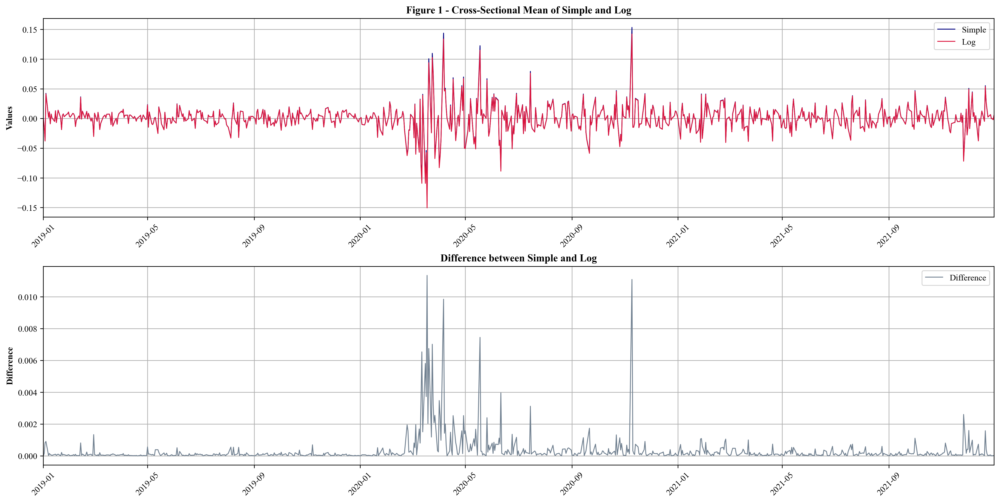

In [25]:
obj = pd.DataFrame({'Simple': simpleDaily.mean(1), 'Log': logDaily.mean(1)})['2019':'2021']
difference = obj['Simple'] - obj['Log']

fig, axs = plt.subplots(2, 1, figsize=(16, 8), constrained_layout=True) #figsize=(12, 10)

# Returns
axs[0].plot(obj.index, obj['Simple'], label='Simple',color='navy', linewidth=1)
axs[0].plot(obj.index, obj['Log'], label='Log',color='crimson', linewidth=1)
axs[0].set_title('Figure 1 - Cross-Sectional Mean of Simple and Log')
axs[0].set_ylabel('Values')
axs[0].legend()
axs[0].grid(True)
axs[0].tick_params(axis='x', rotation=45)

# Difference
axs[1].plot(obj.index, difference, label='Difference', color='slategrey', linewidth=1)
axs[1].set_title('Difference between Simple and Log')
axs[1].set_ylabel('Difference')
axs[1].legend()
axs[1].grid(True)
axs[1].tick_params(axis='x', rotation=45)

axs[0].set_xlim(obj.index.min(), obj.index.max())
axs[1].set_xlim(obj.index.min(), obj.index.max())

plt.show()

Figure 2 - Simple vs Log values, Q1

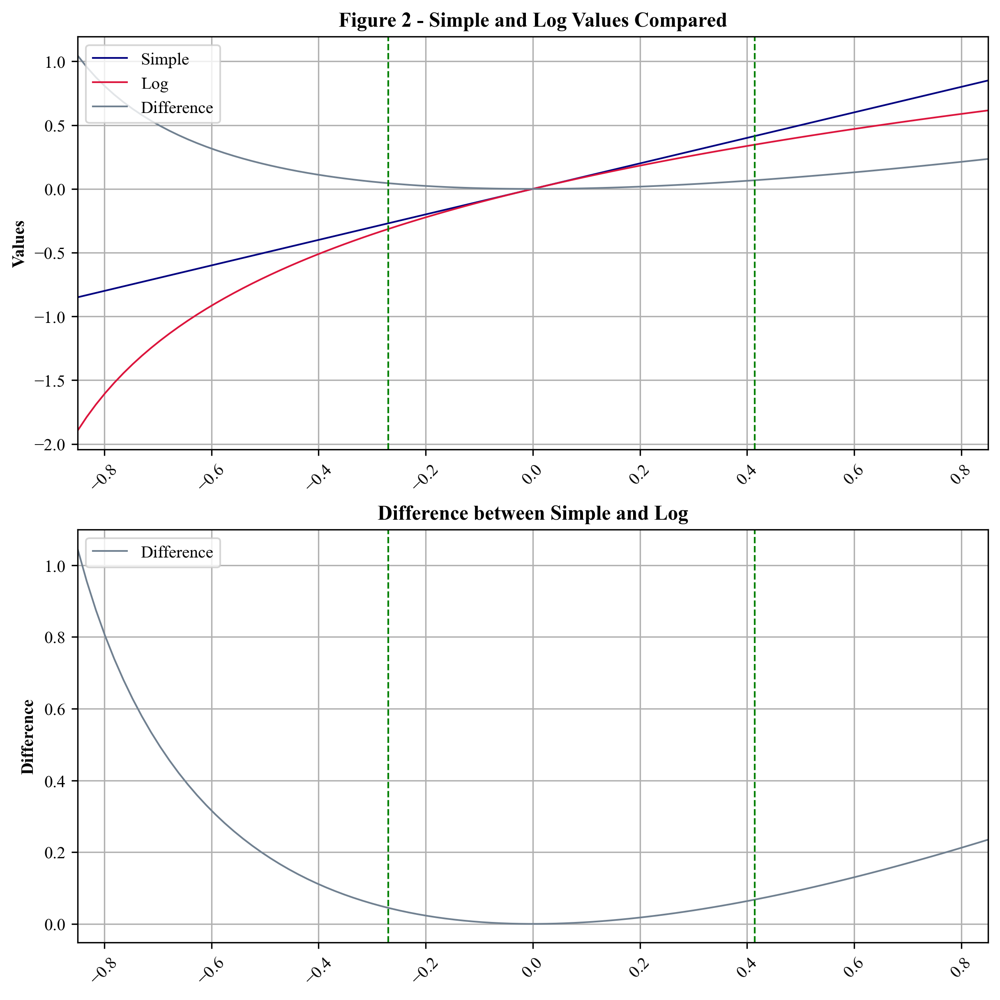

In [26]:
simpvis = np.linspace(-0.85, 0.85, 100)
logvis = np.log1p(simpvis)
sl_vis = pd.DataFrame({'Simple': simpvis, 'Log': logvis})
difference = sl_vis['Simple']-sl_vis['Log']

fig, axs = plt.subplots(2, 1, figsize=(8, 8), constrained_layout=True) #figsize=(12, 10)

maxobs = 0.414708
minobs = -0.270168

# Series
axs[0].plot(sl_vis['Simple'], sl_vis['Simple'], label='Simple',color='navy', linewidth=1)
axs[0].plot(sl_vis['Simple'], sl_vis['Log'], label='Log',color='crimson', linewidth=1)
axs[0].plot(sl_vis['Simple'], difference, label='Difference', color='slategrey', linewidth=1)
axs[0].set_title('Figure 2 - Simple and Log Values Compared')
axs[0].set_ylabel('Values')
axs[0].legend(loc='upper left', frameon=True)
axs[0].grid(True)
axs[0].tick_params(axis='x', rotation=45)

# Difference
axs[1].plot(sl_vis['Simple'], difference, label='Difference', color='slategrey', linewidth=1)
axs[1].set_title('Difference between Simple and Log')
axs[1].set_ylabel('Difference')
axs[1].legend(loc='upper left', frameon=True)
axs[1].grid(True)
axs[1].tick_params(axis='x', rotation=45)

axs[0].set_xlim(sl_vis['Simple'].min(), sl_vis['Simple'].max())
axs[1].set_xlim(sl_vis['Simple'].min(), sl_vis['Simple'].max())

for ax in axs:
    ax.axvline(x=minobs, color='green', linestyle='--', label='Lowest Sample Returns', linewidth=1)
    ax.axvline(x=maxobs, color='green', linestyle='--', label='Highest Sample Returns', linewidth=1)

plt.show()

Figure 3 - Daily Stats, Q1.1

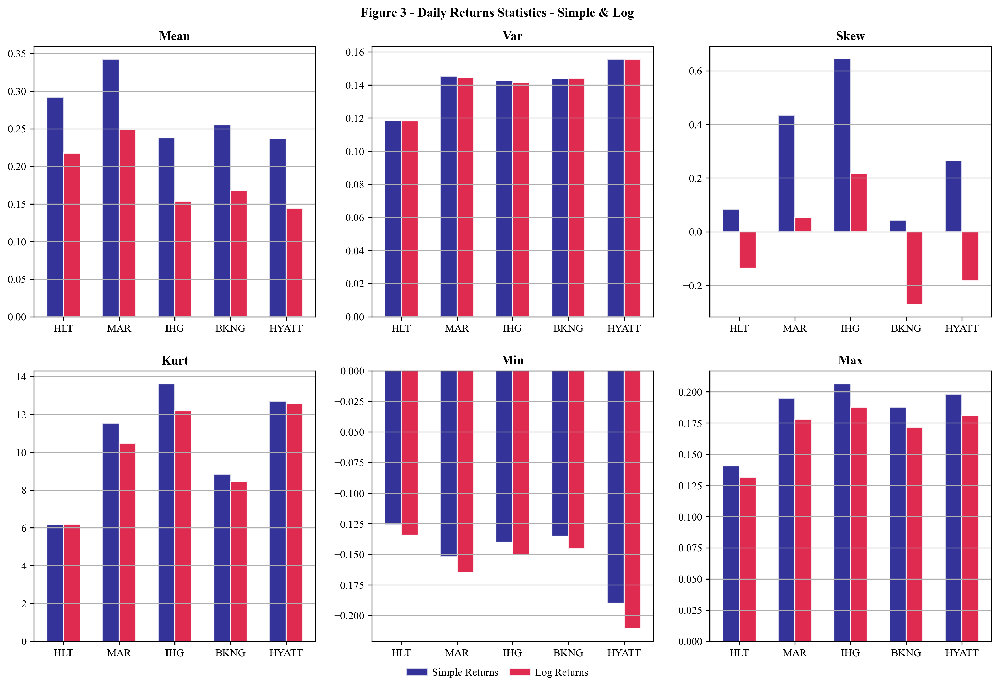

In [27]:
df_simple = sd_stats
df_log = ld_stats
stocks = dailyData.columns
index = np.arange(len(stocks))
bar_width = 0.3

fig, axs = plt.subplots(2, 3, figsize=(16, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)
fig.suptitle('Figure 3 - Daily Returns Statistics - Simple & Log', y=0.93, fontweight='bold')

for ax, stat in zip(axs.flat, statistics):
    simple_stat = df_simple.loc[stat]
    log_stat = df_log.loc[stat]
    index = np.arange(len(stocks))
    ax.grid(True, axis='y')
    ax.bar(index - bar_width/2, simple_stat, bar_width, color='navy', alpha=0.8, edgecolor='w')
    ax.bar(index + bar_width/2, log_stat, bar_width, color='crimson', alpha=0.9, edgecolor='w')
    ax.set_title(stat.capitalize())
    ax.set_xticks(index)
    ax.set_xticklabels(stocks)

fig.legend(('Simple Returns', 'Log Returns'), loc='lower center', ncol=2, frameon=False, bbox_to_anchor=(0.5, 0.05), handletextpad=0.4, columnspacing=1)
plt.show()

Figure 4 - Weekly Stats, Q1.2

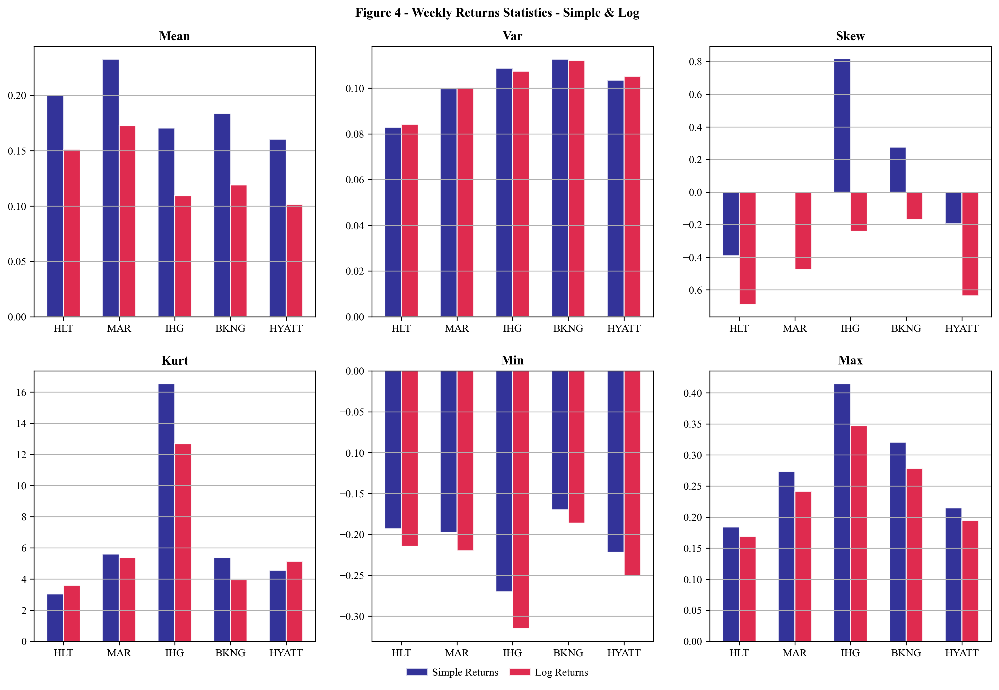

In [28]:
df_simple = sw_stats
df_log = lw_stats
stocks = weeklyData.columns
index = np.arange(len(stocks))
bar_width = 0.3

fig, axs = plt.subplots(2, 3, figsize=(16, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)
fig.suptitle('Figure 4 - Weekly Returns Statistics - Simple & Log', y=0.93, fontweight='bold')

for ax, stat in zip(axs.flat, statistics):
    simple_stat = df_simple.loc[stat]
    log_stat = df_log.loc[stat]
    index = np.arange(len(stocks))
    ax.grid(True, axis='y')
    ax.bar(index - bar_width/2, simple_stat, bar_width, color='navy', alpha=0.8, edgecolor='w')
    ax.bar(index + bar_width/2, log_stat, bar_width, color='crimson', alpha=0.9, edgecolor='w')
    ax.set_title(stat.capitalize())
    ax.set_xticks(index)
    ax.set_xticklabels(stocks)

fig.legend(('Simple Returns', 'Log Returns'), loc='lower center', ncol=2, frameon=False, bbox_to_anchor=(0.5, 0.05), handletextpad=0.4, columnspacing=1)
plt.show()

Figure 5 - Daily vs weekly Q1.3

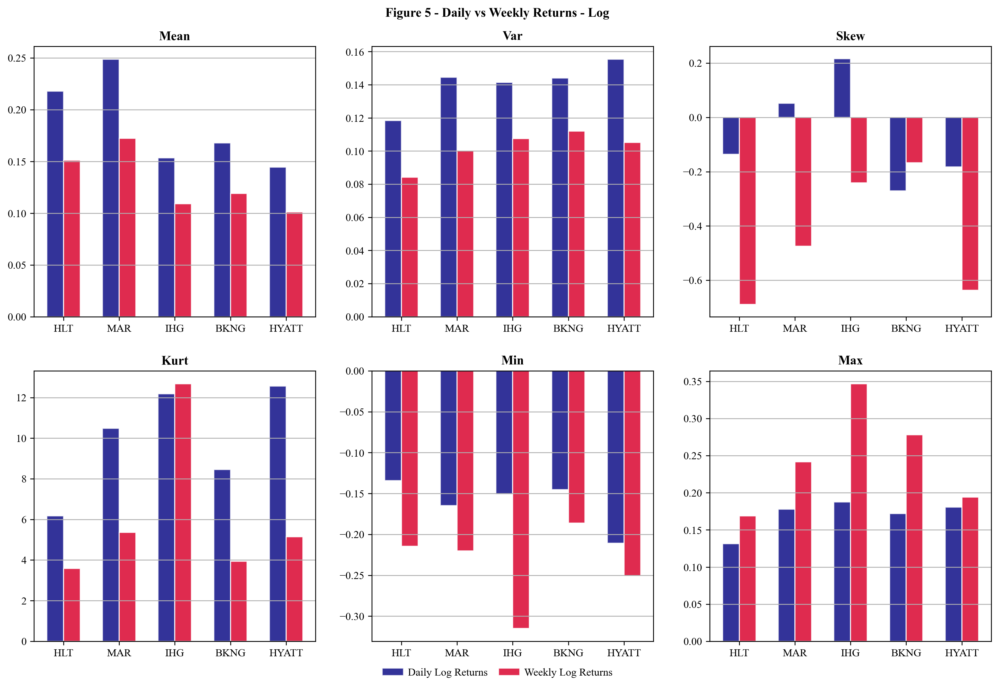

In [29]:
df_simple = ld_stats
df_log = lw_stats
stocks = weeklyData.columns
index = np.arange(len(stocks))
bar_width = 0.3

fig, axs = plt.subplots(2, 3, figsize=(16, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)
fig.suptitle('Figure 5 - Daily vs Weekly Returns - Log', y=0.93, fontweight='bold')

for ax, stat in zip(axs.flat, statistics):
    simple_stat = df_simple.loc[stat]
    log_stat = df_log.loc[stat]
    index = np.arange(len(stocks))
    ax.grid(True, axis='y')
    ax.bar(index - bar_width/2, simple_stat, bar_width, color='navy', alpha=0.8, edgecolor='w')
    ax.bar(index + bar_width/2, log_stat, bar_width, color='crimson', alpha=0.9, edgecolor='w')
    ax.set_title(stat.capitalize())
    ax.set_xticks(index)
    ax.set_xticklabels(stocks)

fig.legend(('Daily Log Returns', 'Weekly Log Returns'), loc='lower center', ncol=2, frameon=False, bbox_to_anchor=(0.5, 0.05), handletextpad=0.4, columnspacing=1)
plt.show()

Figure 6 - Random Walks, Q2.4

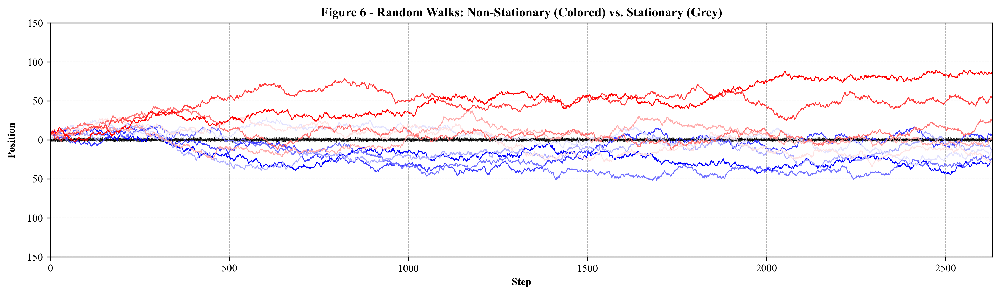

In [30]:
T = dailyData.shape[0]
N = 100
simNS = []
simS = []

while N > 0:

    simErrors = np.random.normal(0, 1, T)
    simSeries = np.cumsum(simErrors) + np.log(1000) # Initial value to avoid negative logarithms
    pt = pd.Series(simSeries)
    simNS.append(simSeries)

    simSeries = pd.Series(index=range(T), dtype='float64')
    simSeries[0] = np.log(1000)
    for t in range (1,T):
        simSeries[t] = 0.2 * simSeries[t-1] + simErrors[t]
    simS.append(simSeries)

    N += -1

rws = pd.DataFrame(simNS).T
rws = rws.sample(10, axis=1)

rwns = pd.DataFrame(simS).T
rwns = rwns.sample(10, axis=1)

max_values = rws[:-1].max()
sorted_columns = max_values.sort_values().index
colors = plt.cm.bwr(np.linspace(0, 1, 10))

plt.figure(figsize=(16, 4))

colors_rwns = plt.cm.binary(np.linspace(0, 1, 10))
for i, col in enumerate(rwns.columns):
    plt.plot(rwns.index, rwns[col], color=colors_rwns[i], lw=0.5, linestyle='-')

for i, col in enumerate(sorted_columns):
    plt.plot(rws.index, rws[col], color=colors[i], lw=0.8)


plt.title('Figure 6 - Random Walks: Non-Stationary (Colored) vs. Stationary (Grey)')
plt.xlabel('Step')
plt.ylabel('Position')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.xlim(0, 2632)
plt.ylim(-150, 150)
plt.hlines(0, xmin=0, xmax=2632, colors='black', linestyle='--', linewidth=0.8)
plt.show()


Figure 7 - Simulated Dickey Fuller, Q2.5

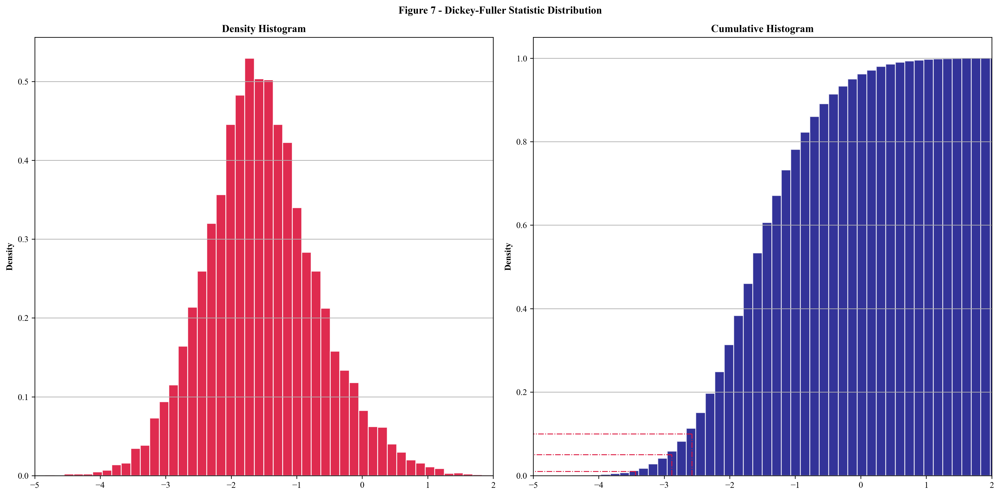

In [31]:
simStatsDF = pd.read_csv(simPath, index_col=0, header=None, skiprows=1)
simStatsDF.columns = ['tstat']
# print(simStatsDF.describe())
conf095 = simStatsDF.quantile(0.05)
conf099 = simStatsDF.quantile(0.01)
conf090 = simStatsDF.quantile(0.10)
minx = simStatsDF.min()

fig, axs = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Figure 7 - Dickey-Fuller Statistic Distribution', y=0.98, fontweight='bold')

axs[0].hist(simStatsDF['tstat'], bins=50, density=True, histtype='bar', color='crimson', edgecolor='w', alpha=0.9)
axs[0].set_title('Density Histogram')
# axs[0].set_xlabel('tstat')
axs[0].set_ylabel('Density')
axs[0].grid(True, axis='y')

axs[1].hist(simStatsDF['tstat'], bins=50, cumulative=True, density=True, histtype='bar', color='navy', alpha=0.8, edgecolor='w')
axs[1].set_title('Cumulative Histogram')
# axs[1].set_xlabel('tstat')
axs[1].set_ylabel('Density')
axs[1].grid(True, axis='y')
# axs[1].plot([conf095, conf095], [0, 0.05], color='red', linestyle='--', linewidth=2)
axs[1].vlines(x=conf095, ymax=0.05, ymin=0, color='crimson', linestyle='-.', linewidth=1)
axs[1].hlines(y=0.05, xmax=-5, xmin=conf095, color='crimson', linestyle='-.', linewidth=1)

axs[1].vlines(x=conf099, ymax=0.01, ymin=0, color='crimson', linestyle='-.', linewidth=1)
axs[1].hlines(y=0.01, xmax=-5, xmin=conf099, color='crimson', linestyle='-.', linewidth=1)

axs[1].vlines(x=conf090, ymax=0.10, ymin=0, color='crimson', linestyle='-.', linewidth=1)
axs[1].hlines(y=0.10, xmax=-5, xmin=conf090, color='crimson', linestyle='-.', linewidth=1)

axs[0].set_xlim(-5, 2)
axs[1].set_xlim(-5, 2)

plt.tight_layout()

Figure 8 - Simulated Stationary Process, Q2.7

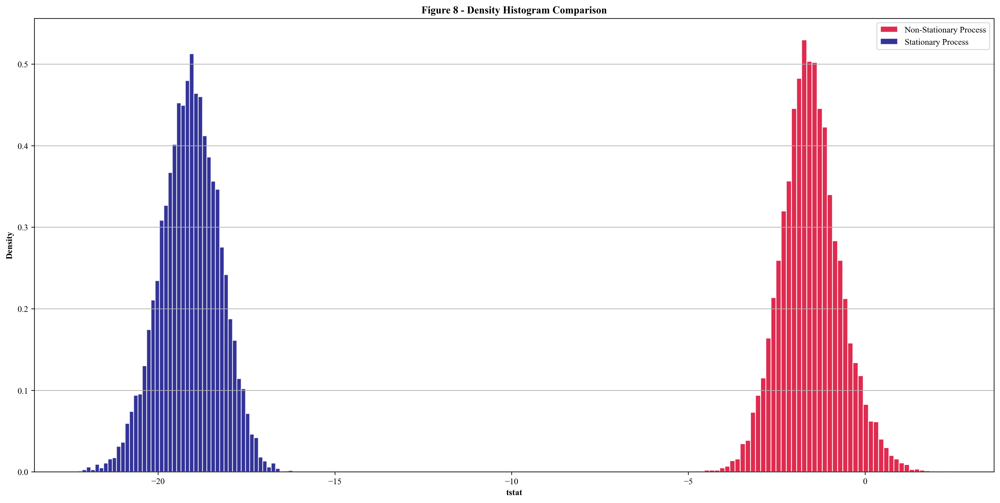

In [32]:
simStatsDF1 = pd.read_csv(simPath, index_col=0, header=None, skiprows=1)
simStatsDF1.columns = ['tstat']

simStatsDF2 = pd.read_csv(simVIIPath, index_col=0, header=None, skiprows=1)
simStatsDF2.columns = ['tstat']

fig, ax = plt.subplots(figsize=(16, 8), constrained_layout=True)

ax.hist(simStatsDF1['tstat'], bins=50, density=True, histtype='bar', color='crimson', edgecolor='w', alpha=0.9, label='Non-Stationary Process')
ax.hist(simStatsDF2['tstat'], bins=50, density=True, histtype='bar', color='navy', edgecolor='w', alpha=0.8, label='Stationary Process')

ax.set_title('Figure 8 - Density Histogram Comparison')
ax.set_xlabel('tstat')
ax.set_ylabel('Density')
ax.grid(True, axis='y')
ax.legend()

plt.show()

Figure 9 - Cointegration Histogram PO, Q3.1

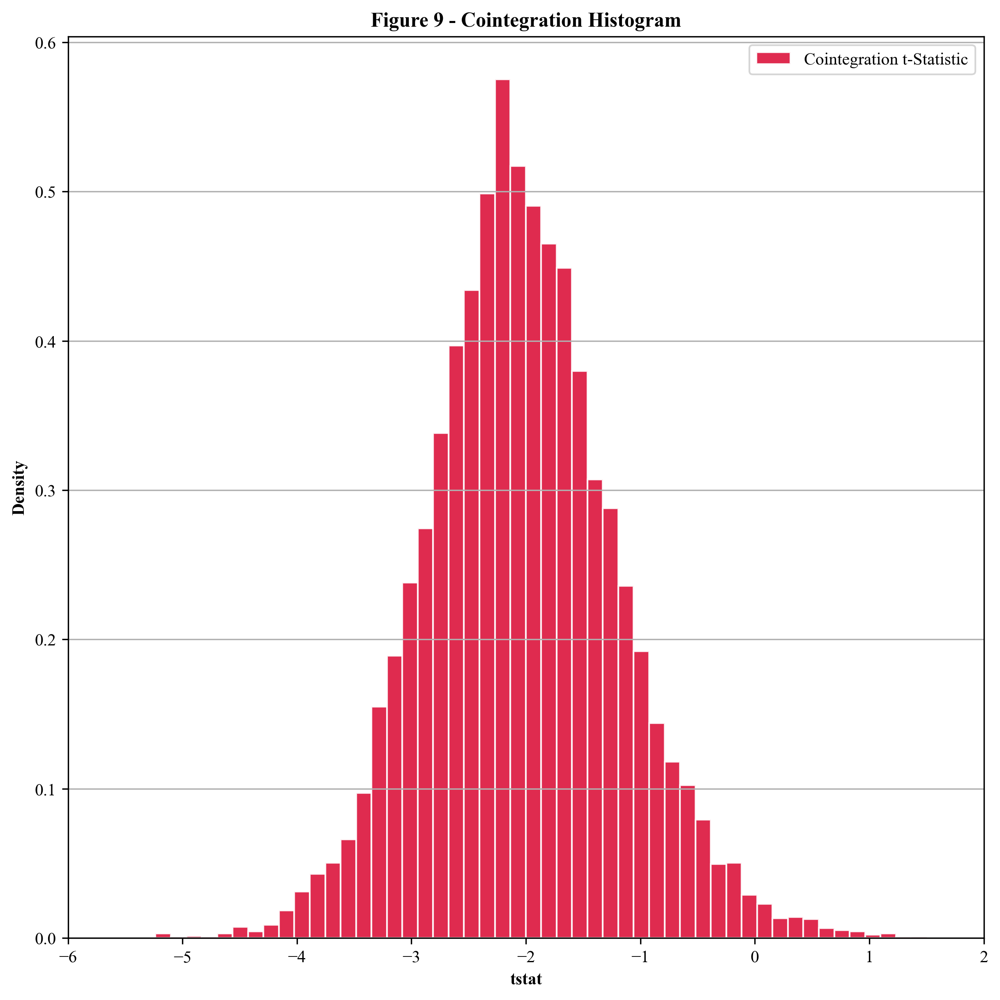

In [33]:
simStatsDF1 = pd.read_csv(simPOPath, index_col=0, header=None, skiprows=1)
simStatsDF1.columns = ['tstat']

fig, ax = plt.subplots(figsize=(8, 8), constrained_layout=True)

ax.hist(simStatsDF1['tstat'], bins=50, density=True, histtype='bar', color='crimson', edgecolor='w', alpha=0.9, label='Cointegration t-Statistic')

ax.set_title('Figure 9 - Cointegration Histogram')
ax.set_xlabel('tstat')
ax.set_ylabel('Density')
ax.grid(True, axis='y')
ax.set_xlim(-6, 2)
ax.legend()

plt.show()

Figure 10 - IHG → MAR cointegration, Q3.5

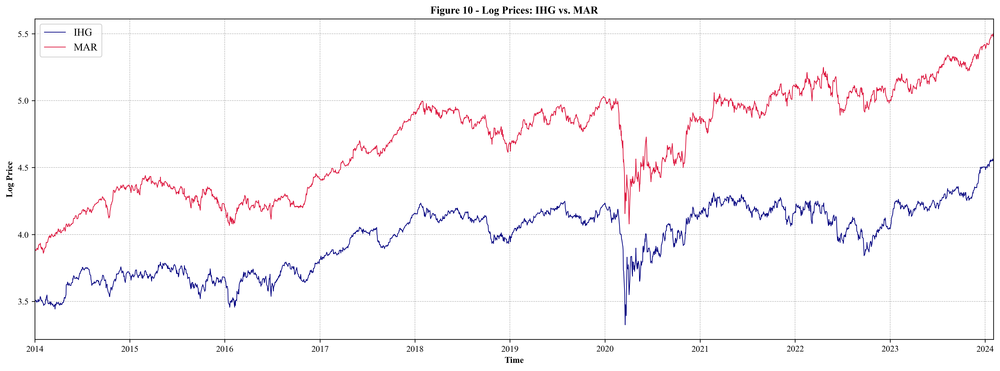

In [34]:
logPrices = np.log(dailyData)

ihg_series = logPrices['IHG']
mar_series = logPrices['MAR']

# Instead of creating subplots, just create a single figure and axis.
fig, ax = plt.subplots(figsize=(16, 6))  # Adjusted for single plot

ax.plot(ihg_series.index, ihg_series, color='navy', lw=0.8, label='IHG')
ax.plot(mar_series.index, mar_series, color='crimson', lw=0.8, label='MAR')

ax.set_title('Figure 10 - Log Prices: IHG vs. MAR')
ax.set_ylabel('Log Price')
ax.set_xlabel('Time')  # Moved xlabel to this plot
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(fontsize=12)
ax.set_xlim(ihg_series.index.min(), ihg_series.index.max())

plt.tight_layout()
plt.show()

Figure 11 - Normalized Spread, Q4.2

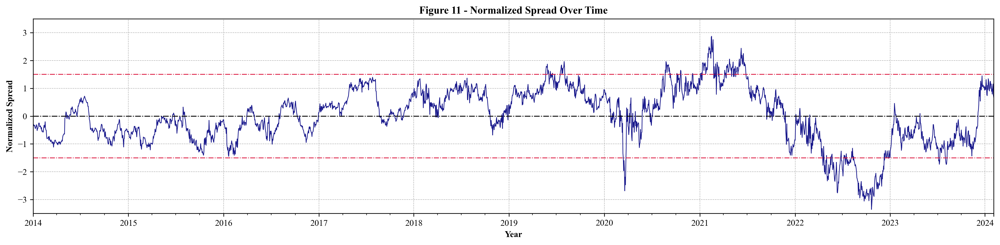

In [35]:
normalized_spread = pd.read_csv(ztPath, index_col='Date')
normalized_spread.columns = ['ztTILDE']
normalized_spread.index = dailyData.index

fig, ax = plt.subplots(figsize=(16, 4))
normalized_spread.plot(ax=ax, legend=False, color='navy', lw=0.8, alpha=0.9)

plt.grid(True, linestyle='--', linewidth=0.5)
plt.title('Figure 11 - Normalized Spread Over Time')
plt.xlabel('Year')
plt.ylabel('Normalized Spread')
plt.hlines(y=-1.5, xmax=normalized_spread.index.max(), xmin=normalized_spread.index.min(), color='crimson', linestyle='-.', linewidth=0.9)
plt.hlines(y=0, xmax=normalized_spread.index.max(), xmin=normalized_spread.index.min(), color='black', linestyle='-.', linewidth=1)
plt.hlines(y=1.5, xmax=normalized_spread.index.max(), xmin=normalized_spread.index.min(), color='crimson', linestyle='-.', linewidth=0.9)
plt.ylim(-3.5, 3.5)

plt.tight_layout()
plt.show()

Figure 12 - Normalized Spread Autocorrelogram, Q4.3

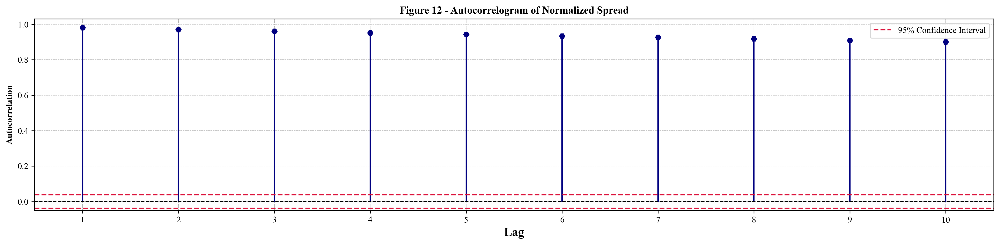

In [36]:
normalized_spread = pd.read_csv(ztPath, index_col='Date')
normalized_spread.columns = ['ztTILDE']
normalized_spread.index = pd.to_datetime(dailyData.index)

N = len(normalized_spread)  
lags = range(1, 11)  
autocorrs = [normalized_spread['ztTILDE'].autocorr(lag=lag) for lag in lags]

# Calculate the approximate 95% confidence interval for autocorrelation
# This uses the formula z * sqrt(1/N), where z is the 1.96 for 95% CI
z = 1.96  # 95% CI
stderr = np.sqrt(1/N)
lower_bound = -z * stderr
upper_bound = z * stderr

fig, ax = plt.subplots(figsize=(16, 4))

ax.vlines(lags, 0, autocorrs, color='navy')
ax.plot(lags, autocorrs, 'H', color='navy', )

ax.axhline(lower_bound, color='crimson', linestyle='--', label='95% Confidence Interval')
ax.axhline(upper_bound, color='crimson', linestyle='--')
ax.axhline(0, color='black', lw=1, ls='--')

plt.title('Figure 12 - Autocorrelogram of Normalized Spread')
plt.xlabel('Lag', fontsize=14)
plt.ylabel('Autocorrelation')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.tight_layout()
plt.xlim(0.5, 10.5)
plt.xticks(np.linspace(1, 10, 10))

plt.show()

Figure 13 - Pair Trading: Z-in=1.5, L=2, Q4.7

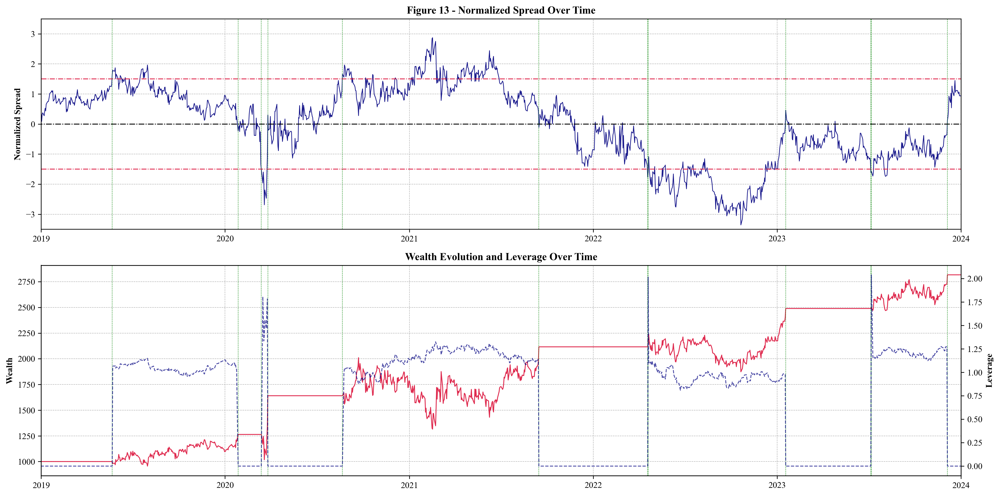

{'final_wealth': 2817.19, 'max': 2817.19, 'min': 955.63, 'n_trades': 12}


In [37]:
normalized_spread = pd.read_csv(ztPath, index_col='Date')
normalized_spread.columns = ['ztTILDE']
normalized_spread.index = dailyData.index

ptStats = pd.read_csv(ptsPath, index_col='Date', parse_dates=True)
changes = ptStats['position_change']
wealth = ptStats['equity_wealth']
leverage = ptStats['leverage']
change_dates = changes[changes == 1].index

fig, axs = plt.subplots(2, 1, figsize=(16, 8), sharex=False, gridspec_kw={'height_ratios': [1, 1]})

axs[0].plot(normalized_spread.index, normalized_spread['ztTILDE'], color='navy', lw=0.8, alpha=0.9)
axs[0].set_title('Figure 13 - Normalized Spread Over Time')
axs[0].set_ylabel('Normalized Spread')
axs[0].hlines(y=-1.5, xmax=normalized_spread.index.max(), xmin=normalized_spread.index.min(), color='crimson', linestyle='-.', linewidth=0.9)
axs[0].hlines(y=0, xmax=normalized_spread.index.max(), xmin=normalized_spread.index.min(), color='black', linestyle='-.', linewidth=1)
axs[0].hlines(y=1.5, xmax=normalized_spread.index.max(), xmin=normalized_spread.index.min(), color='crimson', linestyle='-.', linewidth=0.9)
axs[0].set_ylim(-3.5, 3.5)
axs[0].set_xlim(pd.Timestamp('2019-01'), pd.Timestamp('2024-01'))

for date in change_dates:
    axs[0].axvline(x=date, color='green', linestyle='--', linewidth=0.4, label='Position Change' if date == change_dates[0] else "")

ax2 = axs[1].twinx()  
axs[1].plot(normalized_spread.index, wealth, color='crimson', lw=1, alpha=0.9, label='Wealth')
ax2.plot(normalized_spread.index, leverage, color='navy', lw=1, alpha=0.7, linestyle='--', label='Leverage')

axs[1].set_title('Wealth Evolution and Leverage Over Time')
axs[1].set_ylabel('Wealth')
ax2.set_ylabel('Leverage')
axs[1].set_ylabel('Wealth')
axs[1].set_xlim(pd.Timestamp('2019-01'), pd.Timestamp('2024-01'))

for date in change_dates:
    axs[1].axvline(x=date, color='green', linestyle='--', linewidth=0.4, label='Position Change' if date == change_dates[0] else "")

axs[0].grid(True, linestyle='--', linewidth=0.5)
axs[1].grid(True, linestyle='--', linewidth=0.5)
ax2.grid(False)
plt.tight_layout()
plt.show()

#########################################
final_wealth = round(wealth.iloc[-1], 2)
largest_wealth = round(wealth.max(), 2)
smallest_wealth = round(wealth.min(), 2)
number_trades = int(changes.sum())
print({'final_wealth': final_wealth, 'max': largest_wealth, 'min': smallest_wealth, 'n_trades': number_trades})

Figure 14 - Pair Trading: Z-in=1.5, L=20, Q4.8

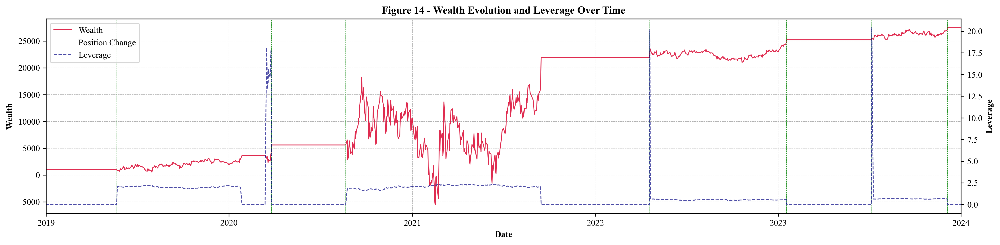

{'final_wealth': 27472.09, 'max': 27472.09, 'min': -5501.44, 'n_trades': 12}


In [38]:
ptStats = pd.read_csv(ptsl20Path, index_col='Date', parse_dates=True)
changes = ptStats['position_change']
wealth = ptStats['equity_wealth']
leverage = ptStats['leverage']
change_dates = changes[changes == 1].index

fig, ax1 = plt.subplots(figsize=(16, 4))

ax1.plot(wealth.index, wealth, color='crimson', lw=1, alpha=0.9, label='Wealth')
ax1.set_title('Figure 14 - Wealth Evolution and Leverage Over Time')
ax1.set_xlabel('Date')
ax1.set_ylabel('Wealth')

ax2 = ax1.twinx()
ax2.plot(leverage.index, leverage, color='navy', lw=1, alpha=0.7, linestyle='--', label='Leverage')
ax2.set_ylabel('Leverage')
ax2.grid(False)

for date in change_dates:
    ax1.axvline(x=date, color='green', linestyle='--', linewidth=0.4, label='Position Change' if date == change_dates[0] else "")

handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles1 + handles2, labels1 + labels2, loc='upper left')

ax1.set_xlim(pd.Timestamp('2019-01'), pd.Timestamp('2024-01'))
ax1.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

final_wealth = round(wealth.iloc[-1], 2)
largest_wealth = round(wealth.max(), 2)
smallest_wealth = round(wealth.min(), 2)
number_trades = int(changes.sum())
print({'final_wealth': final_wealth, 'max': largest_wealth, 'min': smallest_wealth, 'n_trades': number_trades})

Figure 15 - Pair Trading with Stoploss: Z-in=1.5, L=2, Q4.7

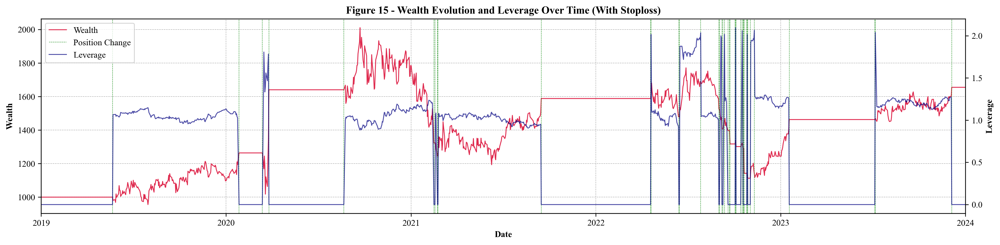

{'final_wealth': 1655.26, 'max': 2010.87, 'min': 955.63, 'n_trades': 40}


In [39]:
ptStats = pd.read_csv(ptsslPath, index_col='Date', parse_dates=True)
changes = ptStats['position_change']
wealth = ptStats['equity_wealth']
leverage = ptStats['leverage']
change_dates = changes[changes == 1].index

final_wealth = round(wealth.iloc[-1], 2)
largest_wealth = round(wealth.max(), 2)
smallest_wealth = round(wealth.max(), 2)
number_trades = int(changes.sum())

fig, ax1 = plt.subplots(figsize=(16, 4))

ax1.plot(wealth.index, wealth, color='crimson', lw=1, alpha=0.9, label='Wealth')
ax1.set_title('Figure 15 - Wealth Evolution and Leverage Over Time (With Stoploss)')
ax1.set_xlabel('Date')
ax1.set_ylabel('Wealth')

ax2 = ax1.twinx()
ax2.plot(leverage.index, leverage, color='navy', lw=1, alpha=0.7, linestyle='-', label='Leverage')
ax2.set_ylabel('Leverage')

for date in change_dates:
    ax1.axvline(x=date, color='green', linestyle='--', linewidth=0.4, label='Position Change' if date == change_dates[0] else "")

handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles1 + handles2, labels1 + labels2, loc='upper left')

ax1.set_xlim(pd.Timestamp('2019-01'), pd.Timestamp('2024-01'))
ax1.grid(True, linestyle='--', linewidth=0.5)
ax2.grid(False)
plt.tight_layout()
plt.show()

final_wealth = round(wealth.iloc[-1], 2)
largest_wealth = round(wealth.max(), 2)
smallest_wealth = round(wealth.min(), 2)
number_trades = int(changes.sum())
print({'final_wealth': final_wealth, 'max': largest_wealth, 'min': smallest_wealth, 'n_trades': number_trades})

Figure 16 - Rolling Correlations, Q4.11

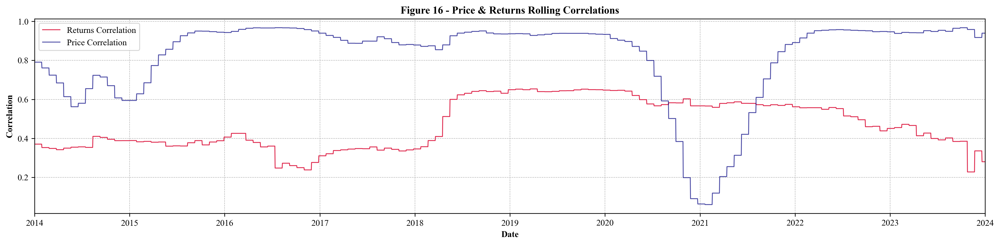

In [40]:
corrs = pd.read_csv(rpPath, index_col='Date', parse_dates=True)

r_corr = corrs['return_correlation']
p_corr = corrs['price_correlation']

fig, ax1 = plt.subplots(figsize=(16, 4))

ax1.plot(r_corr.index, r_corr, color='crimson', lw=1, alpha=0.9, label='Returns Correlation')
ax1.set_title('Figure 16 - Price & Returns Rolling Correlations')
ax1.set_xlabel('Date')
ax1.set_ylabel('Correlation')  # Shared Y-axis label

ax1.plot(p_corr.index, p_corr, color='navy', lw=1, alpha=0.7, linestyle='-', label='Price Correlation')
ax1.legend(loc='upper left')
ax1.set_xlim(pd.Timestamp('2014-01'), pd.Timestamp('2024-01'))

plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()

Figure 17 - Rolling Parameters, Q4.12

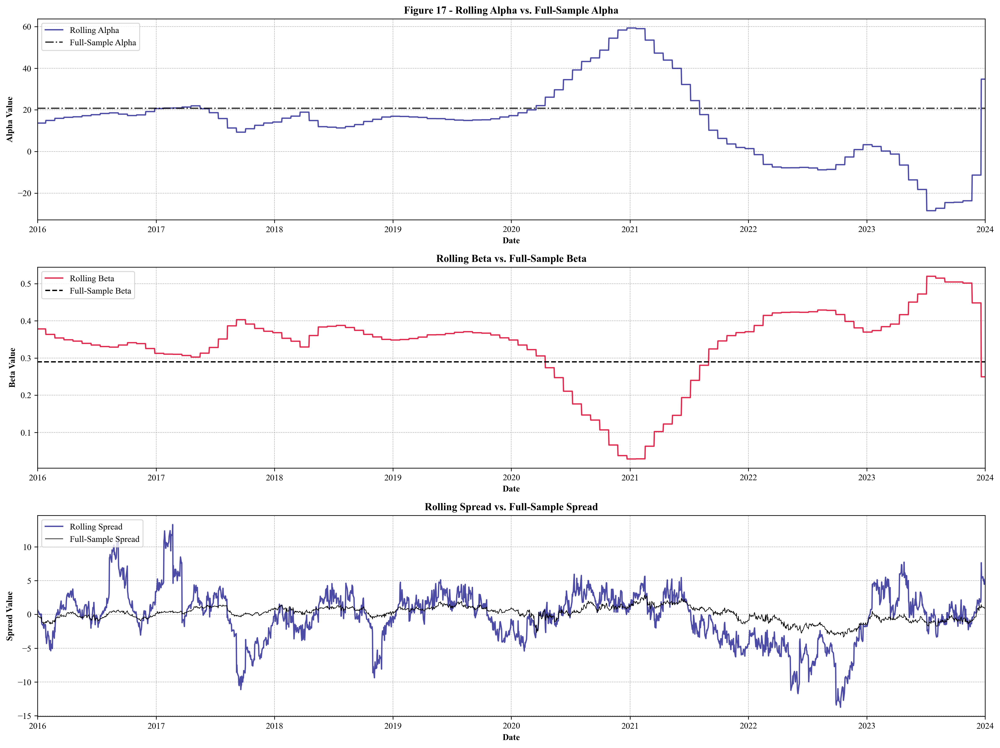

In [41]:
corrs = pd.read_csv(rpPath, index_col='Date', parse_dates=True)

rolling_alpha = corrs['alpha']
rolling_beta = corrs['beta']
rolling_ztilde = corrs['ztilde']

out_of_sample_alpha = corrs['alpha_full']
out_of_sample_beta = corrs['beta_full']
out_of_sample_ztilde = corrs['ztilde_full']

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 12))  # 3 rows, 1 column

# Plotting alphas on the first subplot
ax1.plot(rolling_alpha.index, rolling_alpha, label='Rolling Alpha', color='navy', linestyle='-', alpha=0.7)
ax1.plot(out_of_sample_alpha.index, out_of_sample_alpha, label='Full-Sample Alpha', color='black', linestyle='-.', alpha=0.8)
ax1.set_title('Figure 17 - Rolling Alpha vs. Full-Sample Alpha')
ax1.set_xlabel('Date')
ax1.set_ylabel('Alpha Value')
ax1.legend(loc='upper left')
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.set_xlim(pd.Timestamp('2016-01'), pd.Timestamp('2024-01'))

# Plotting betas on the second subplot
ax2.plot(rolling_beta.index, rolling_beta, label='Rolling Beta', color='crimson', linestyle='-', alpha=0.9)
ax2.plot(out_of_sample_beta.index, out_of_sample_beta, label='Full-Sample Beta', color='black', linestyle='--', alpha=1)
ax2.set_title('Rolling Beta vs. Full-Sample Beta')
ax2.set_xlabel('Date')
ax2.set_ylabel('Beta Value')
ax2.legend(loc='upper left')
ax2.grid(True, linestyle='--', linewidth=0.5)
ax2.set_xlim(pd.Timestamp('2016-01'), pd.Timestamp('2024-01'))
# ax2.set_ylim(-1, 1)

# Plotting ztildes on the third subplot
ax3.plot(rolling_ztilde.index, rolling_ztilde, label='Rolling Spread', color='navy', linestyle='-', alpha=0.7)
ax3.plot(out_of_sample_ztilde.index, out_of_sample_ztilde, label='Full-Sample Spread', color='black', linestyle='-', alpha=1, linewidth=0.7)
ax3.set_title('Rolling Spread vs. Full-Sample Spread')
ax3.set_xlabel('Date')
ax3.set_ylabel('Spread Value')
ax3.legend(loc='upper left')
ax3.grid(True, linestyle='--', linewidth=0.5)
ax3.set_xlim(pd.Timestamp('2016-01'), pd.Timestamp('2024-01'))

plt.tight_layout()
plt.show()

Figure 18 - Full Sample vs Out of Sample with Stoploss, Q4.13

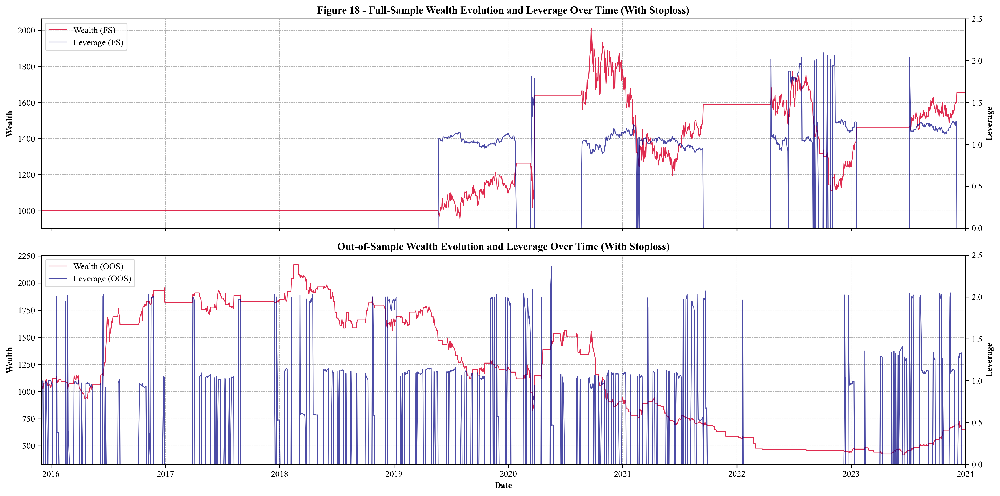

{'final_wealth': 663.46, 'max': 2169.93, 'min': 416.69, 'n_trades': 377}


In [42]:
ptStatsOOS = pd.read_csv(ptsslPath, index_col='Date', parse_dates=True)
ptStatsIS = pd.read_csv(ptsslisPath, index_col='Date', parse_dates=True)
changes = ptStatsOOS['position_change']
wealth = ptStatsOOS['equity_wealth']
leverage = ptStatsOOS['leverage']

changesIS = ptStatsIS['position_change']
wealthIS = ptStatsIS['equity_wealth']
leverageIS = ptStatsIS['leverage']

change_dates = changes[changes == 1].index
change_datesIS = changesIS[changesIS == 1].index

fig, (ax1, ax3) = plt.subplots(2, 1, figsize=(16, 8), sharex=True)

ax1.plot(wealth.index, wealth, color='crimson', lw=1, alpha=0.9, label='Wealth (FS)')
ax2 = ax1.twinx()
ax2.plot(leverage.index, leverage, color='navy', lw=1, alpha=0.7, linestyle='-', label='Leverage (FS)')
ax2.set_ylim(0, 2.5)

# for date in change_dates:
#     ax1.axvline(x=date, color='green', linestyle='--', linewidth=0.5, label='Position Change (OOS)' if date == change_dates[0] else "")

ax3.plot(wealthIS.index, wealthIS, color='crimson', lw=1, alpha=0.9, linestyle='-', label='Wealth (OOS)')
ax4 = ax3.twinx()
ax4.plot(leverageIS.index, leverageIS, color='navy', lw=1, alpha=0.7, linestyle='-', label='Leverage (OOS)')
ax4.set_ylim(0, 2.5)

# for date in change_datesIS:
#     ax3.axvline(x=date, color='green', linestyle='--', linewidth=0.5, label='Position Change (IS)' if date == change_datesIS[0] else "")

ax1.set_title('Figure 18 - Full-Sample Wealth Evolution and Leverage Over Time (With Stoploss)')
ax3.set_title('Out-of-Sample Wealth Evolution and Leverage Over Time (With Stoploss)')
ax3.set_xlabel('Date')
ax1.set_ylabel('Wealth')
ax2.set_ylabel('Leverage')
ax3.set_ylabel('Wealth')
ax4.set_ylabel('Leverage')
ax1.set_xlim(pd.Timestamp('2015-01'), pd.Timestamp('2024-01'))

handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(handles1 + handles2, labels1 + labels2, loc='upper left')

handles3, labels3 = ax3.get_legend_handles_labels()
handles4, labels4 = ax4.get_legend_handles_labels()
ax3.legend(handles3 + handles4, labels3 + labels4, loc='upper left')

ax3.set_xlim(pd.Timestamp('2015-12'), pd.Timestamp('2024-01'))
ax1.grid(True, linestyle='--', linewidth=0.5)
ax3.grid(True, linestyle='--', linewidth=0.5)
ax2.grid(False)
ax4.grid(False)

plt.tight_layout()

plt.show()

#########################################
final_wealth = round(wealthIS.iloc[-1], 2)
largest_wealth = round(wealthIS.max(), 2)
smallest_wealth = round(wealthIS.min(), 2)
number_trades = int(changesIS.sum())
print({'final_wealth': final_wealth, 'max': largest_wealth, 'min': smallest_wealth, 'n_trades': number_trades})

Figure 19 - P-values over time, Q4.14

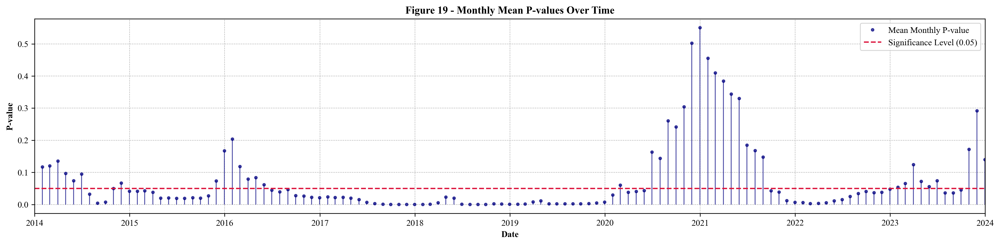

In [43]:
corrs = pd.read_csv(rpPath, index_col='Date', parse_dates=True)
p_values = corrs['CI_pval']

fig, ax = plt.subplots(figsize=(16, 4))

"""
Note that we resample the p-values to monthly values for a better visual appearance, 
the non-resampled values present an identical picture but look less appealing
"""

p_values_monthly = p_values.resample('M').mean()

ax.vlines(p_values_monthly.index, 0, p_values_monthly, color='navy', alpha=0.7, linewidth=1)
ax.plot(p_values_monthly.index, p_values_monthly, '.', color='navy', alpha=0.7, label='Mean Monthly P-value')
ax.axhline(0.05, color='crimson', linestyle='--', label='Significance Level (0.05)')
ax.set_xlim(pd.Timestamp('2014-01'), pd.Timestamp('2024-01'))

plt.title('Figure 19 - Monthly Mean P-values Over Time')
plt.xlabel('Date')
plt.ylabel('P-value')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.tight_layout()

plt.show()

Figure 20 - In-sample strategy with stoploss and cointegration breakdown portection, Q4.15

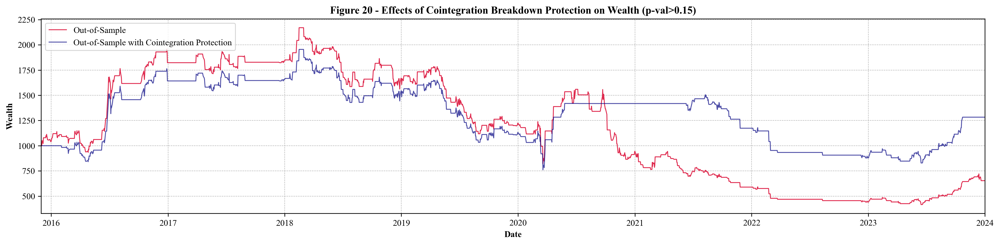

{'final_wealth': 1302.42, 'max': 1954.69, 'min': 760.7, 'n_trades': 298}


In [44]:
ptStatsOOS = pd.read_csv(ptsslisPath, index_col='Date', parse_dates=True)
ptStatsIS = pd.read_csv(ptsslispvlPath, index_col='Date', parse_dates=True)
wealthOOS = ptStatsOOS['equity_wealth']  # Now considered In Sample
wealthIS = ptStatsIS['equity_wealth']  # In Sample with Cointegration Protection

fig, ax = plt.subplots(figsize=(16, 4))

# Plotting wealth series
ax.plot(wealthOOS.index, wealthOOS, color='crimson', lw=1, alpha=0.9, label='Out-of-Sample')
ax.plot(wealthIS.index, wealthIS, color='navy', lw=1, alpha=0.7, label='Out-of-Sample with Cointegration Protection')

# Setting titles and labels
ax.set_title('Figure 20 - Effects of Cointegration Breakdown Protection on Wealth (p-val>0.15)')
ax.set_xlabel('Date')
ax.set_ylabel('Wealth')

# Adding legend
ax.legend(loc='upper left')

# Setting grid
ax.grid(True, linestyle='--', linewidth=0.5)

# Adjusting x-axis limits if necessary
ax.set_xlim(pd.Timestamp('2015-12'), pd.Timestamp('2024-01'))

plt.tight_layout()
plt.show()

#########################################
changesIS = ptStatsIS['position_change']
final_wealth = round(wealthIS.iloc[-1], 2)
largest_wealth = round(wealthIS.max(), 2)
smallest_wealth = round(wealthIS.min(), 2)
number_trades = int(changesIS.sum())
print({'final_wealth': final_wealth, 'max': largest_wealth, 'min': smallest_wealth, 'n_trades': number_trades})